In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier

from sklearn.preprocessing import StandardScaler, RobustScaler
from imblearn.over_sampling import SMOTE
from sklearn.decomposition import PCA

from sklearn.metrics import confusion_matrix, classification_report, roc_curve, roc_auc_score, auc
from sklearn.model_selection import cross_val_score

sns.set_style('darkgrid')
%matplotlib inline

## Load Data

In [2]:
from sklearn.datasets import load_breast_cancer
cancer = load_breast_cancer()

In [3]:
cancer

{'data': array([[1.799e+01, 1.038e+01, 1.228e+02, ..., 2.654e-01, 4.601e-01,
         1.189e-01],
        [2.057e+01, 1.777e+01, 1.329e+02, ..., 1.860e-01, 2.750e-01,
         8.902e-02],
        [1.969e+01, 2.125e+01, 1.300e+02, ..., 2.430e-01, 3.613e-01,
         8.758e-02],
        ...,
        [1.660e+01, 2.808e+01, 1.083e+02, ..., 1.418e-01, 2.218e-01,
         7.820e-02],
        [2.060e+01, 2.933e+01, 1.401e+02, ..., 2.650e-01, 4.087e-01,
         1.240e-01],
        [7.760e+00, 2.454e+01, 4.792e+01, ..., 0.000e+00, 2.871e-01,
         7.039e-02]]),
 'target': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
        0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0,
        1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0,
        1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1,
        1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0

In [4]:
cancer.keys()

dict_keys(['data', 'target', 'target_names', 'DESCR', 'feature_names', 'filename'])

In [5]:
cancer['target_names']

array(['malignant', 'benign'], dtype='<U9')

In [6]:
cancer['target']

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0,
       1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0,
       1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1,
       1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0,
       0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1,
       1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0,
       0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0,
       1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1,
       1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0,

In [7]:
# features
feature = pd.DataFrame(cancer['data'], columns=cancer['feature_names'])
feature

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,0.07871,...,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,0.05667,...,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,0.05999,...,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,0.09744,...,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,0.05883,...,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,0.05623,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,0.05533,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,0.05648,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,0.07016,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


In [8]:
# label / target
target = pd.DataFrame(cancer['target'], columns=['target'])
target

,target
0,0
1,0
2,0
3,0
4,0
...,...
564,0
565,0
566,0
567,0


In [9]:
df_cancer = pd.concat([feature, target], axis=1)
df_cancer

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,0.07871,...,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890,0
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,0.05667,...,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902,0
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,0.05999,...,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758,0
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,0.09744,...,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300,0
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,0.05883,...,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,0.05623,...,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115,0
565,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,0.05533,...,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637,0
566,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,0.05648,...,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820,0
567,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,0.07016,...,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400,0


## EDA

- 0 = Malignant --> Cancer
- 1 = Benign --> Not Cancer
- 212 Malignant, 357 Benign

In [10]:
df_cancer['target'].value_counts()

1    357
0    212
Name: target, dtype: int64

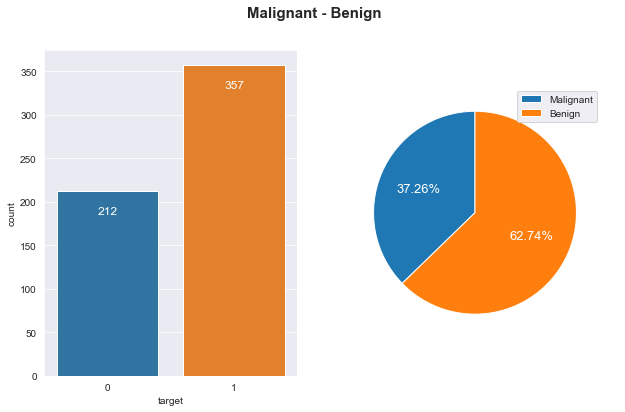

In [11]:
plt.figure(figsize=(10,6))
plt.suptitle('Malignant - Benign', size= 15, fontweight="bold")

plt.subplot(1,2,1)
ax = sns.countplot(df_cancer['target'])
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.0f'), (p.get_x() + p.get_width() / 2., p.get_height()), ha = 'center', 
                   va = 'center', xytext = (0, -20), fontsize=12, color='white', textcoords = 'offset points')


plt.subplot(1,2,2)
size = [len(df_cancer[df_cancer['target']==0]),len(df_cancer[df_cancer['target']==1])]
labels = ['Malignant', 'Benign']
plt.pie(size, labels=labels, autopct='%2.2f%%', textprops={'size':13,'color':'white'}, startangle=90)
plt.legend()

plt.show()

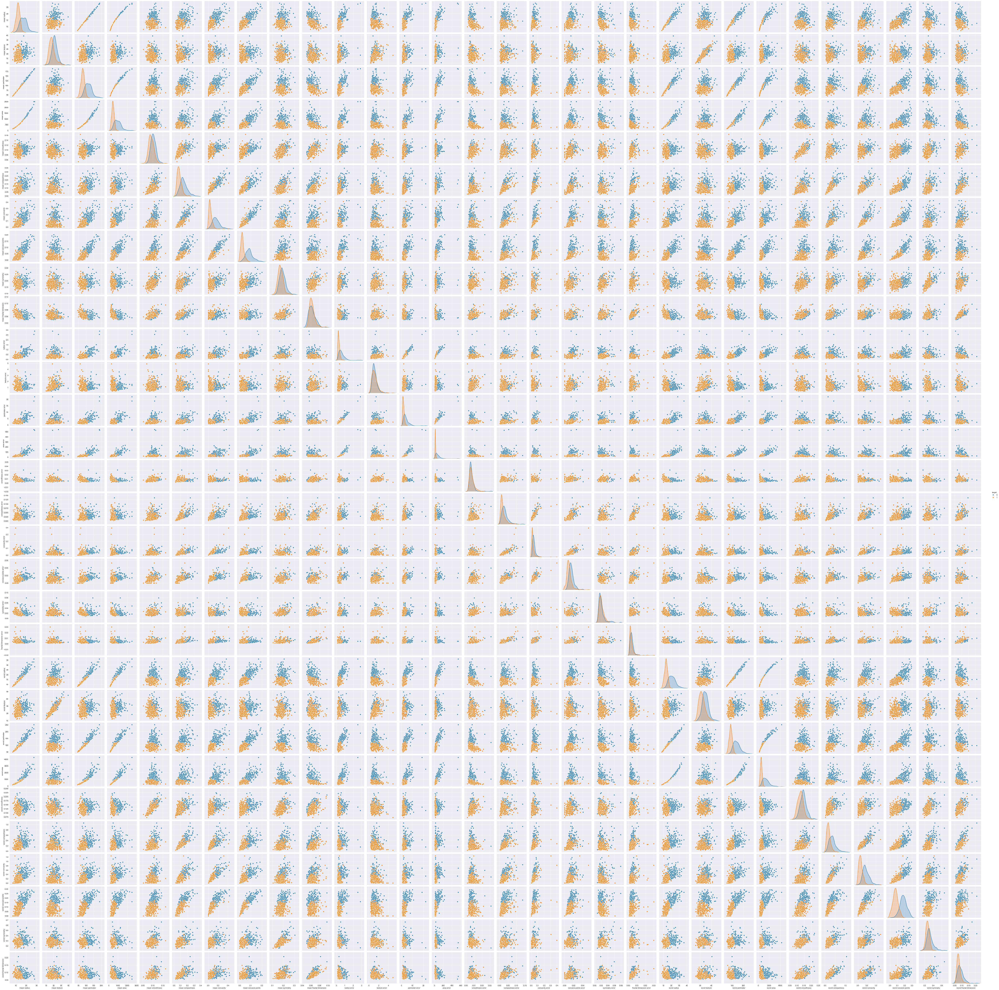

In [12]:
sns.pairplot(df_cancer, hue='target')

## Correlation

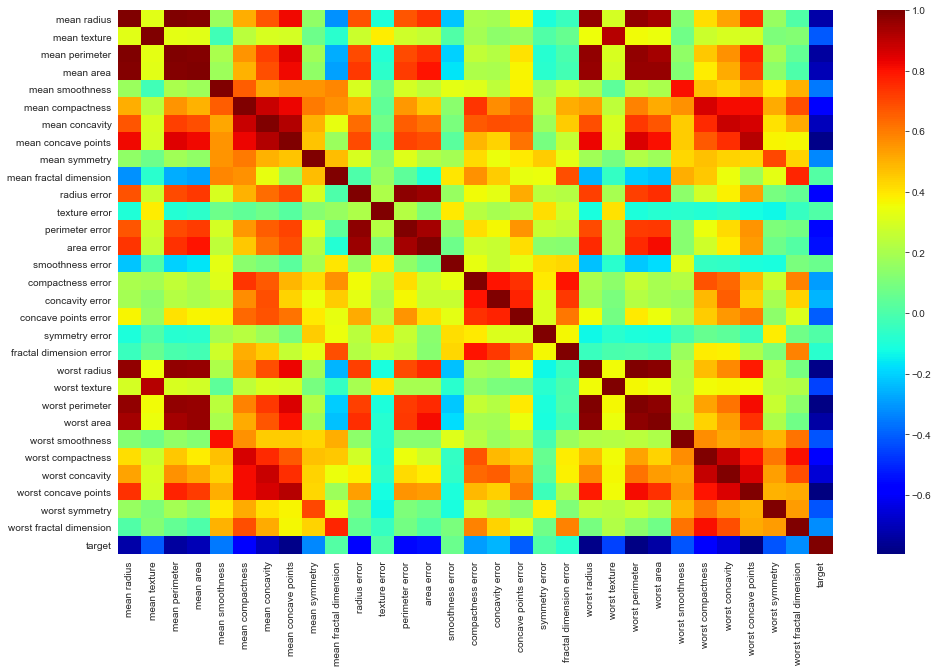

In [13]:
plt.figure(figsize=(16,10))
sns.heatmap(df_cancer.corr(), cmap='jet')
plt.show()

In [14]:
df_cor = df_cancer.corr()[['target']].sort_values('target')
df_cor

,target
worst concave points,-0.793566
worst perimeter,-0.782914
mean concave points,-0.776614
worst radius,-0.776454
mean perimeter,-0.742636
worst area,-0.733825
mean radius,-0.730029
mean area,-0.708984
mean concavity,-0.696360
worst concavity,-0.659610


In [15]:
df_cor.describe()

,target
count,31.000000
mean,-0.416802
std,0.371835
min,-0.793566
25%,-0.702672
50%,-0.456903
75%,-0.308436
max,1.000000


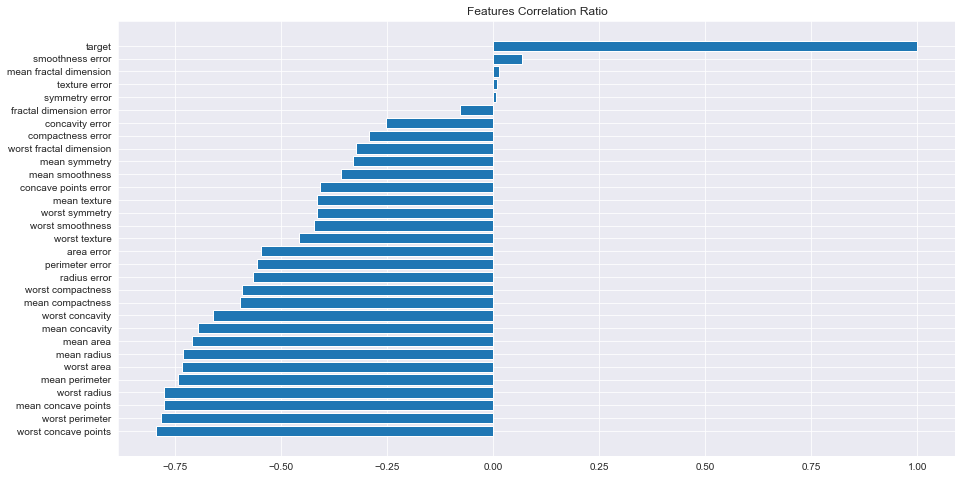

In [16]:
plt.figure(figsize=(15,8))
plt.title('Features Correlation Ratio')

plt.barh(width = df_cor['target'], y=df_cor.index)
plt.show()

## Standardize

In [17]:
scaler = StandardScaler()

In [18]:
features = scaler.fit_transform(df_cancer.drop('target',axis=1))
scaled_data = pd.DataFrame(features, columns=df_cancer.columns.drop('target'))
scaled_data

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,1.097064,-2.073335,1.269934,0.984375,1.568466,3.283515,2.652874,2.532475,2.217515,2.255747,...,1.886690,-1.359293,2.303601,2.001237,1.307686,2.616665,2.109526,2.296076,2.750622,1.937015
1,1.829821,-0.353632,1.685955,1.908708,-0.826962,-0.487072,-0.023846,0.548144,0.001392,-0.868652,...,1.805927,-0.369203,1.535126,1.890489,-0.375612,-0.430444,-0.146749,1.087084,-0.243890,0.281190
2,1.579888,0.456187,1.566503,1.558884,0.942210,1.052926,1.363478,2.037231,0.939685,-0.398008,...,1.511870,-0.023974,1.347475,1.456285,0.527407,1.082932,0.854974,1.955000,1.152255,0.201391
3,-0.768909,0.253732,-0.592687,-0.764464,3.283553,3.402909,1.915897,1.451707,2.867383,4.910919,...,-0.281464,0.133984,-0.249939,-0.550021,3.394275,3.893397,1.989588,2.175786,6.046041,4.935010
4,1.750297,-1.151816,1.776573,1.826229,0.280372,0.539340,1.371011,1.428493,-0.009560,-0.562450,...,1.298575,-1.466770,1.338539,1.220724,0.220556,-0.313395,0.613179,0.729259,-0.868353,-0.397100
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,2.110995,0.721473,2.060786,2.343856,1.041842,0.219060,1.947285,2.320965,-0.312589,-0.931027,...,1.901185,0.117700,1.752563,2.015301,0.378365,-0.273318,0.664512,1.629151,-1.360158,-0.709091
565,1.704854,2.085134,1.615931,1.723842,0.102458,-0.017833,0.693043,1.263669,-0.217664,-1.058611,...,1.536720,2.047399,1.421940,1.494959,-0.691230,-0.394820,0.236573,0.733827,-0.531855,-0.973978
566,0.702284,2.045574,0.672676,0.577953,-0.840484,-0.038680,0.046588,0.105777,-0.809117,-0.895587,...,0.561361,1.374854,0.579001,0.427906,-0.809587,0.350735,0.326767,0.414069,-1.104549,-0.318409
567,1.838341,2.336457,1.982524,1.735218,1.525767,3.272144,3.296944,2.658866,2.137194,1.043695,...,1.961239,2.237926,2.303601,1.653171,1.430427,3.904848,3.197605,2.289985,1.919083,2.219635


In [19]:
scaled_data['target'] = df_cancer['target']
scaled_data

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
0,1.097064,-2.073335,1.269934,0.984375,1.568466,3.283515,2.652874,2.532475,2.217515,2.255747,...,-1.359293,2.303601,2.001237,1.307686,2.616665,2.109526,2.296076,2.750622,1.937015,0
1,1.829821,-0.353632,1.685955,1.908708,-0.826962,-0.487072,-0.023846,0.548144,0.001392,-0.868652,...,-0.369203,1.535126,1.890489,-0.375612,-0.430444,-0.146749,1.087084,-0.243890,0.281190,0
2,1.579888,0.456187,1.566503,1.558884,0.942210,1.052926,1.363478,2.037231,0.939685,-0.398008,...,-0.023974,1.347475,1.456285,0.527407,1.082932,0.854974,1.955000,1.152255,0.201391,0
3,-0.768909,0.253732,-0.592687,-0.764464,3.283553,3.402909,1.915897,1.451707,2.867383,4.910919,...,0.133984,-0.249939,-0.550021,3.394275,3.893397,1.989588,2.175786,6.046041,4.935010,0
4,1.750297,-1.151816,1.776573,1.826229,0.280372,0.539340,1.371011,1.428493,-0.009560,-0.562450,...,-1.466770,1.338539,1.220724,0.220556,-0.313395,0.613179,0.729259,-0.868353,-0.397100,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,2.110995,0.721473,2.060786,2.343856,1.041842,0.219060,1.947285,2.320965,-0.312589,-0.931027,...,0.117700,1.752563,2.015301,0.378365,-0.273318,0.664512,1.629151,-1.360158,-0.709091,0
565,1.704854,2.085134,1.615931,1.723842,0.102458,-0.017833,0.693043,1.263669,-0.217664,-1.058611,...,2.047399,1.421940,1.494959,-0.691230,-0.394820,0.236573,0.733827,-0.531855,-0.973978,0
566,0.702284,2.045574,0.672676,0.577953,-0.840484,-0.038680,0.046588,0.105777,-0.809117,-0.895587,...,1.374854,0.579001,0.427906,-0.809587,0.350735,0.326767,0.414069,-1.104549,-0.318409,0
567,1.838341,2.336457,1.982524,1.735218,1.525767,3.272144,3.296944,2.658866,2.137194,1.043695,...,2.237926,2.303601,1.653171,1.430427,3.904848,3.197605,2.289985,1.919083,2.219635,0


## Train Test Split

In [20]:
X = scaled_data.drop('target', axis=1)
y = scaled_data['target']

In [21]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.3, random_state=42)

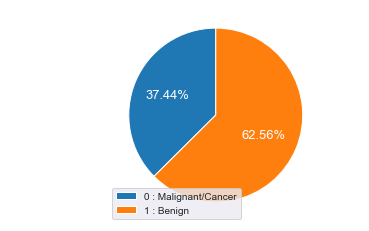

In [22]:
size = len(y_train[y_train==0]), len(y_train[y_train==1])
labels = ['0 : Malignant/Cancer', '1 : Benign']

plt.pie(size, labels=labels, autopct='%.2f%%', startangle=90, textprops={'size':13, 'color':'white'})
plt.legend()
plt.show()

## Modeling
- Fokus pada kecilnya skor FP
- FP = actualnya 0 / malignant(ganas) tapi diprediksi 1 / benign (tidak ganas)
- Fokus pada Precision(+), Recall(-), accuracy, roc auc

In [23]:
scaled_data.head()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
0,1.097064,-2.073335,1.269934,0.984375,1.568466,3.283515,2.652874,2.532475,2.217515,2.255747,...,-1.359293,2.303601,2.001237,1.307686,2.616665,2.109526,2.296076,2.750622,1.937015,0
1,1.829821,-0.353632,1.685955,1.908708,-0.826962,-0.487072,-0.023846,0.548144,0.001392,-0.868652,...,-0.369203,1.535126,1.890489,-0.375612,-0.430444,-0.146749,1.087084,-0.243890,0.281190,0
2,1.579888,0.456187,1.566503,1.558884,0.942210,1.052926,1.363478,2.037231,0.939685,-0.398008,...,-0.023974,1.347475,1.456285,0.527407,1.082932,0.854974,1.955000,1.152255,0.201391,0
3,-0.768909,0.253732,-0.592687,-0.764464,3.283553,3.402909,1.915897,1.451707,2.867383,4.910919,...,0.133984,-0.249939,-0.550021,3.394275,3.893397,1.989588,2.175786,6.046041,4.935010,0
4,1.750297,-1.151816,1.776573,1.826229,0.280372,0.539340,1.371011,1.428493,-0.009560,-0.562450,...,-1.466770,1.338539,1.220724,0.220556,-0.313395,0.613179,0.729259,-0.868353,-0.397100,0


### Suport Vector Machines (SVC)

In [24]:
svc = SVC(probability=True)
svc.fit(X_train, y_train)

SVC(C=1.0, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='scale', kernel='rbf',
    max_iter=-1, probability=True, random_state=None, shrinking=True, tol=0.001,
    verbose=False)

In [25]:
pred_svc = svc.predict(X_test)
proba_svc = svc.predict_proba(X_test)

In [26]:
print(confusion_matrix(y_test, pred_svc))

[[ 61   2]
 [  3 105]]


In [27]:
print(classification_report(y_test, pred_svc))

              precision    recall  f1-score   support

           0       0.95      0.97      0.96        63
           1       0.98      0.97      0.98       108

    accuracy                           0.97       171
   macro avg       0.97      0.97      0.97       171
weighted avg       0.97      0.97      0.97       171



In [28]:
cr_svc = classification_report(y_test,pred_svc,output_dict=True)
cr_svc = pd.DataFrame(cr_svc).T
cr_svc

,precision,recall,f1-score,support
0,0.953125,0.968254,0.960630,63.00000
1,0.981308,0.972222,0.976744,108.00000
accuracy,0.970760,0.970760,0.970760,0.97076
macro avg,0.967217,0.970238,0.968687,171.00000
weighted avg,0.970925,0.970760,0.970807,171.00000


In [29]:
cv_score_svc = round(cross_val_score(svc, X_test, y_test, cv = 10, scoring='precision').mean()*100,2)
cv_score_svc

96.72

### Logistic Regeression

In [30]:
logreg = LogisticRegression()
logreg.fit(X_train,y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [31]:
pred_logreg = logreg.predict(X_test)
proba_logreg = logreg.predict_proba(X_test)

In [32]:
print(confusion_matrix(y_test, pred_logreg))

[[ 62   1]
 [  2 106]]


In [33]:
print(classification_report(y_test, pred_logreg))

              precision    recall  f1-score   support

           0       0.97      0.98      0.98        63
           1       0.99      0.98      0.99       108

    accuracy                           0.98       171
   macro avg       0.98      0.98      0.98       171
weighted avg       0.98      0.98      0.98       171



In [34]:
cr_logreg = classification_report(y_test,pred_logreg,output_dict=True)
cr_logreg = pd.DataFrame(cr_logreg).T
cr_logreg

,precision,recall,f1-score,support
0,0.968750,0.984127,0.976378,63.000000
1,0.990654,0.981481,0.986047,108.000000
accuracy,0.982456,0.982456,0.982456,0.982456
macro avg,0.979702,0.982804,0.981212,171.000000
weighted avg,0.982584,0.982456,0.982484,171.000000


In [35]:
cv_score_logreg = round(cross_val_score(logreg, X_test, y_test, cv = 10, scoring='precision').mean()*100,2)
cv_score_logreg

97.63

### Decision Tree Classifier

In [36]:
dtree = DecisionTreeClassifier()
dtree.fit(X_train,y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

In [37]:
pred_dt = dtree.predict(X_test)
proba_dt = dtree.predict_proba(X_test)

In [38]:
print(confusion_matrix(y_test, pred_dt))

[[59  4]
 [ 9 99]]


In [39]:
print(classification_report(y_test, pred_dt))

              precision    recall  f1-score   support

           0       0.87      0.94      0.90        63
           1       0.96      0.92      0.94       108

    accuracy                           0.92       171
   macro avg       0.91      0.93      0.92       171
weighted avg       0.93      0.92      0.92       171



In [40]:
cr_dt = classification_report(y_test,pred_dt,output_dict=True)
cr_dt = pd.DataFrame(cr_dt).T
cr_dt

,precision,recall,f1-score,support
0,0.867647,0.936508,0.900763,63.000000
1,0.961165,0.916667,0.938389,108.000000
accuracy,0.923977,0.923977,0.923977,0.923977
macro avg,0.914406,0.926587,0.919576,171.000000
weighted avg,0.926711,0.923977,0.924527,171.000000


In [41]:
cv_score_dt = round(cross_val_score(dtree, X_test, y_test, cv = 10, scoring='precision').mean()*100,2)
cv_score_dt

95.72

### Random Forest Classifier

In [42]:
rfc = RandomForestClassifier()
rfc.fit(X_train,y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [43]:
pred_rfc = rfc.predict(X_test)
proba_rfc = rfc.predict_proba(X_test)

In [44]:
print(confusion_matrix(y_test, pred_rfc))

[[ 59   4]
 [  1 107]]


In [45]:
cr_rfc = classification_report(y_test,pred_rfc,output_dict=True)
cr_rfc = pd.DataFrame(cr_rfc).T
cr_rfc

,precision,recall,f1-score,support
0,0.983333,0.936508,0.959350,63.00000
1,0.963964,0.990741,0.977169,108.00000
accuracy,0.970760,0.970760,0.970760,0.97076
macro avg,0.973649,0.963624,0.968259,171.00000
weighted avg,0.971100,0.970760,0.970604,171.00000


In [46]:
cv_score_rfc = round(cross_val_score(rfc, X_test, y_test, cv = 10, scoring='precision').mean()*100,2)
cv_score_rfc

94.98

### Gradient Boosting Classifier

In [47]:
gradient = GradientBoostingClassifier()
gradient.fit(X_train, y_train)

GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='deviance', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_impurity_split=None,
                           min_samples_leaf=1, min_samples_split=2,
                           min_weight_fraction_leaf=0.0, n_estimators=100,
                           n_iter_no_change=None, presort='deprecated',
                           random_state=None, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)

In [48]:
pred_gradient = gradient.predict(X_test)
proba_gradient = gradient.predict_proba(X_test)

In [49]:
print(confusion_matrix(y_test, pred_gradient))

[[ 59   4]
 [  3 105]]


In [50]:
print(classification_report(y_test, pred_gradient))

              precision    recall  f1-score   support

           0       0.95      0.94      0.94        63
           1       0.96      0.97      0.97       108

    accuracy                           0.96       171
   macro avg       0.96      0.95      0.96       171
weighted avg       0.96      0.96      0.96       171



In [51]:
cr_grad = classification_report(y_test,pred_gradient,output_dict=True)
cr_grad = pd.DataFrame(cr_grad).T
cr_grad

,precision,recall,f1-score,support
0,0.951613,0.936508,0.944000,63.000000
1,0.963303,0.972222,0.967742,108.000000
accuracy,0.959064,0.959064,0.959064,0.959064
macro avg,0.957458,0.954365,0.955871,171.000000
weighted avg,0.958996,0.959064,0.958995,171.000000


In [52]:
cv_score_grad = round(cross_val_score(gradient, X_test, y_test, cv = 10, scoring='precision').mean()*100,2)
cv_score_grad

95.79

### K Nearest Neighbors

In [53]:
knn = KNeighborsClassifier()
knn.fit(X_train, y_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                     weights='uniform')

In [54]:
pred_knn = knn.predict(X_test)
proba_knn = knn.predict_proba(X_test)

In [55]:
print(confusion_matrix(y_test, pred_knn))

[[ 59   4]
 [  3 105]]


In [56]:
print(classification_report(y_test, pred_knn))

              precision    recall  f1-score   support

           0       0.95      0.94      0.94        63
           1       0.96      0.97      0.97       108

    accuracy                           0.96       171
   macro avg       0.96      0.95      0.96       171
weighted avg       0.96      0.96      0.96       171



#### Elbow Method

In [57]:
error_rate = []

for i in range(1,50):
    knn_k = KNeighborsClassifier(n_neighbors=i)
    knn_k.fit(X_train, y_train)
    pred_i = knn_k.predict(X_test)
    error_rate.append(np.mean(pred_i != y_test))

Text(0, 0.5, 'Error')

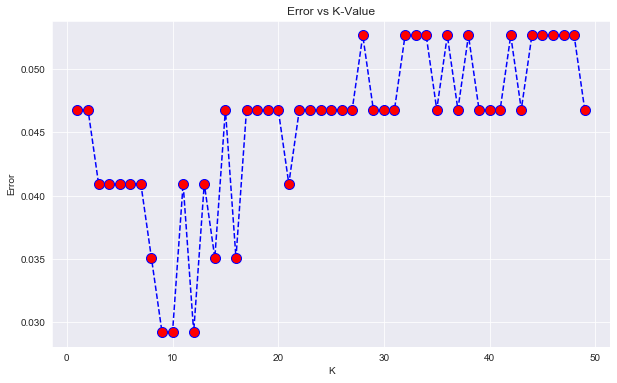

In [58]:
plt.figure(figsize=(10,6))
plt.plot(range(1,50), error_rate, color='blue', linestyle='dashed', marker='o', markerfacecolor='red', markersize=10)
plt.title('Error vs K-Value')
plt.xlabel('K')
plt.ylabel('Error')

In [59]:
# Best K = 10
knn = KNeighborsClassifier(n_neighbors=10)
knn.fit(X_train, y_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=10, p=2,
                     weights='uniform')

In [60]:
pred_knn = knn.predict(X_test)
proba_knn = knn.predict_proba(X_test)

In [61]:
print(confusion_matrix(y_test, pred_knn))

[[ 60   3]
 [  2 106]]


In [62]:
print(classification_report(y_test, pred_knn))

              precision    recall  f1-score   support

           0       0.97      0.95      0.96        63
           1       0.97      0.98      0.98       108

    accuracy                           0.97       171
   macro avg       0.97      0.97      0.97       171
weighted avg       0.97      0.97      0.97       171



In [63]:
cr_knn = classification_report(y_test,pred_knn,output_dict=True)
cr_knn = pd.DataFrame(cr_knn).T
cr_knn

,precision,recall,f1-score,support
0,0.967742,0.952381,0.960000,63.00000
1,0.972477,0.981481,0.976959,108.00000
accuracy,0.970760,0.970760,0.970760,0.97076
macro avg,0.970109,0.966931,0.968479,171.00000
weighted avg,0.970733,0.970760,0.970711,171.00000


In [64]:
cv_score_knn = round(cross_val_score(knn, X_test, y_test, cv = 10, scoring='precision').mean()*100,2)
cv_score_knn

94.42

## ROC AUC

In [65]:
prob_svc = proba_svc[:,1]
fpr_svc, tpr_svc, threshold_svc = roc_curve(y_test, prob_svc)
roc_auc_svc = auc(fpr_svc, tpr_svc)

prob_logreg = proba_logreg[:,1]
fpr_logreg, tpr_logreg, threshold_logreg = roc_curve(y_test, prob_logreg)
roc_auc_logreg = auc(fpr_logreg, tpr_logreg)

prob_dt = proba_dt[:,1]
fpr_dt, tpr_dt, threshold_dt = roc_curve(y_test, prob_dt)
roc_auc_dt = auc(fpr_dt, tpr_dt)

prob_rfc = proba_rfc[:,1]
fpr_rfc, tpr_rfc, threshold_rfc = roc_curve(y_test, prob_rfc)
roc_auc_rfc = auc(fpr_rfc, tpr_rfc)

prob_gradient = proba_gradient[:,1]
fpr_gradient, tpr_gradient, threshold_gradient = roc_curve(y_test, prob_gradient)
roc_auc_gradient = auc(fpr_gradient, tpr_gradient)

prob_knn = proba_knn[:,1]
fpr_knn, tpr_knn, threshold_knn = roc_curve(y_test, prob_knn)
roc_auc_knn = auc(fpr_knn, tpr_knn)

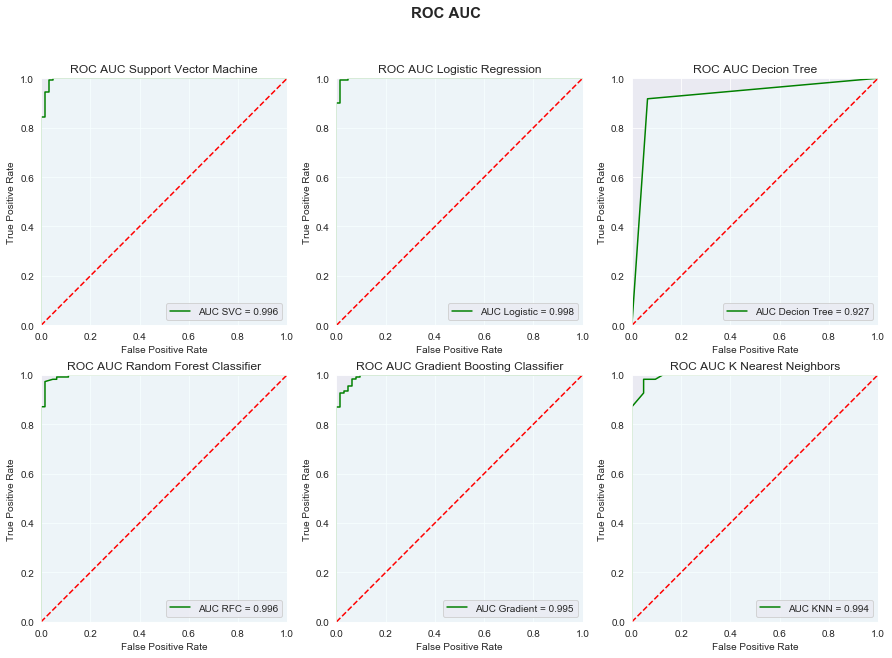

In [66]:
plt.figure(figsize=(15,10))
plt.suptitle('ROC AUC',  fontsize=15, fontweight='bold')

plt.subplot(231)
plt.title('ROC AUC Support Vector Machine')
plt.plot(fpr_svc, tpr_svc, 'green', label='AUC SVC = {}'.format(round(roc_auc_svc,3)))
plt.plot([0,1],[0,1], 'r--')
plt.xlim([0,1])
plt.ylim([0,1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.fill_between(fpr_svc,tpr_svc, 0, facecolor='azure', alpha=0.5)
plt.legend(loc = 'lower right')

plt.subplot(232)
plt.title('ROC AUC Logistic Regression')
plt.plot(fpr_logreg, tpr_logreg, 'green', label='AUC Logistic = {}'.format(round(roc_auc_logreg,3)))
plt.plot([0,1],[0,1], 'r--')
plt.xlim([0,1])
plt.ylim([0,1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.fill_between(fpr_logreg,tpr_logreg, 0, facecolor='azure', alpha=0.5)
plt.legend(loc = 'lower right')

plt.subplot(233)
plt.title('ROC AUC Decion Tree')
plt.plot(fpr_dt, tpr_dt, 'green', label='AUC Decion Tree = {}'.format(round(roc_auc_dt,3)))
plt.plot([0,1],[0,1], 'r--')
plt.xlim([0,1])
plt.ylim([0,1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.fill_between(fpr_dt,tpr_dt, 0, facecolor='azure', alpha=0.5)
plt.legend(loc = 'lower right')

plt.subplot(234)
plt.title('ROC AUC Random Forest Classifier')
plt.plot(fpr_rfc, tpr_rfc, 'green', label='AUC RFC = {}'.format(round(roc_auc_rfc,3)))
plt.plot([0,1],[0,1], 'r--')
plt.xlim([0,1])
plt.ylim([0,1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.fill_between(fpr_rfc,tpr_rfc, 0, facecolor='azure', alpha=0.5)
plt.legend(loc = 'lower right')

plt.subplot(235)
plt.title('ROC AUC Gradient Boosting Classifier')
plt.plot(fpr_gradient, tpr_gradient, 'green', label='AUC Gradient = {}'.format(round(roc_auc_gradient,3)))
plt.plot([0,1],[0,1], 'r--')
plt.xlim([0,1])
plt.ylim([0,1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.fill_between(fpr_gradient,tpr_gradient, 0, facecolor='azure', alpha=0.5)
plt.legend(loc = 'lower right')

plt.subplot(236)
plt.title('ROC AUC K Nearest Neighbors')
plt.plot(fpr_knn, tpr_knn, 'green', label='AUC KNN = {}'.format(round(roc_auc_knn,3)))
plt.plot([0,1],[0,1], 'r--')
plt.xlim([0,1])
plt.ylim([0,1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.fill_between(fpr_knn,tpr_knn, 0, facecolor='azure', alpha=0.5)
plt.legend(loc = 'lower right')

plt.show()

## Metric Evaluation Summary

In [67]:
#SVM
prec_svc= round(cr_svc.iloc[1,0]*100,2)
rec_svc = round(cr_svc.iloc[0,1]*100,2)
acc_svc = round(cr_svc.iloc[2,0]*100,2)
auc_svc = round(auc(fpr_svc, tpr_svc)*100,3)

#Logistic Regression
prec_logreg = round(cr_logreg.iloc[1,0]*100,2)
rec_logreg = round(cr_logreg.iloc[0,1]*100,2)
acc_logerg = round(cr_logreg.iloc[2,0]*100,2)
auc_logreg = round(auc(fpr_logreg, tpr_logreg)*100,3)

#Decision Tree
prec_dt = round(cr_dt.iloc[1,0]*100,2)
rec_dt = round(cr_dt.iloc[0,1]*100,2)
acc_dt = round(cr_dt.iloc[2,0]*100,2)
auc_dt = round(auc(fpr_dt, tpr_dt)*100,3)

#Random Forest
prec_rfc = round(cr_rfc.iloc[1,0]*100,2)
rec_rfc = round(cr_rfc.iloc[0,1]*100,2)
acc_rfc = round(cr_rfc.iloc[2,0]*100,2)
auc_rfc = round(auc(fpr_rfc, tpr_rfc)*100,3)

#Gradient Boosting
prec_grad = round(cr_grad.iloc[1,0]*100,2)
rec_grad = round(cr_grad.iloc[0,1]*100,2)
acc_grad = round(cr_grad.iloc[2,0]*100,2)
auc_grad = round(auc(fpr_gradient, tpr_gradient)*100,3)

#KNN
prec_knn = round(cr_knn.iloc[1,0]*100,2)
rec_knn = round(cr_knn.iloc[0,1]*100,2)
acc_knn = round(cr_knn.iloc[2,0]*100,2)
auc_knn = round(auc(fpr_knn, tpr_knn)*100,3)


all_prec = [prec_svc, prec_logreg, prec_dt, prec_rfc, prec_grad, prec_knn]
all_rec = [rec_svc, rec_logreg,rec_dt,rec_rfc,rec_grad, rec_knn]
all_acc = [acc_svc, acc_logerg, acc_dt, acc_rfc, acc_grad, acc_knn]
all_auc = [acc_svc, auc_logreg, auc_dt, auc_rfc, auc_grad, auc_knn]

all_cv_score = [cv_score_svc, cv_score_logreg, cv_score_dt, cv_score_rfc, cv_score_grad, cv_score_knn]

In [68]:
df_mtrc = pd.DataFrame([all_prec,all_rec,all_acc, all_auc, all_cv_score], 
                       columns=['svm', 'logreg', 'dtree', 'rfc', 'gradboost', 'knn'],
                       index=['precision(+)', 'recall(-)', 'accuracy', 'auc', 'cv_score'])
df_mtrc = df_mtrc.T
df_mtrc

,precision(+),recall(-),accuracy,auc,cv_score
svm,98.13,96.83,97.08,97.080,96.72
logreg,99.07,98.41,98.25,99.809,97.63
dtree,96.12,93.65,92.40,92.659,95.72
rfc,96.40,93.65,97.08,99.647,94.98
gradboost,96.33,93.65,95.91,99.456,95.79
knn,97.25,95.24,97.08,99.397,94.42


In [69]:
#Sort by Metric Score
df_mtrc.sort_values(['precision(+)', 'recall(-)', 'accuracy', 'auc', 'cv_score'], ascending=False)

,precision(+),recall(-),accuracy,auc,cv_score
logreg,99.07,98.41,98.25,99.809,97.63
svm,98.13,96.83,97.08,97.080,96.72
knn,97.25,95.24,97.08,99.397,94.42
rfc,96.40,93.65,97.08,99.647,94.98
gradboost,96.33,93.65,95.91,99.456,95.79
dtree,96.12,93.65,92.40,92.659,95.72


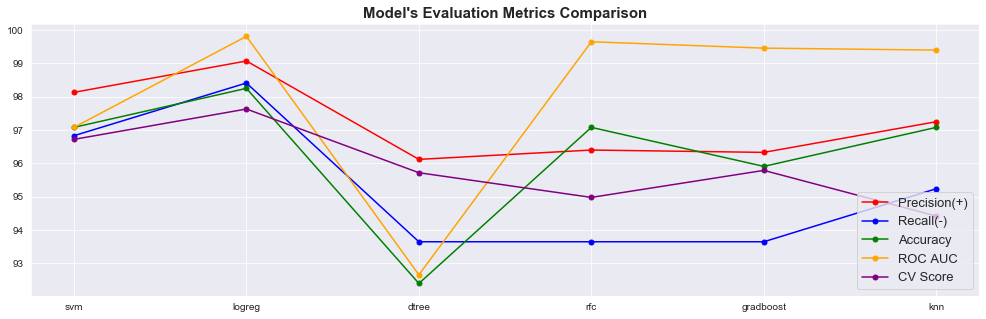

In [70]:
plt.figure(figsize=(17,5))
plt.title("Model's Evaluation Metrics Comparison", size=15, fontweight='bold')

plt.plot(df_mtrc.index, df_mtrc['precision(+)'], label = 'Precision(+)', color='red', marker='o', markersize=5)
plt.plot(df_mtrc.index, df_mtrc['recall(-)'], label = 'Recall(-)', color='blue', marker='o', markersize=5)
plt.plot(df_mtrc.index, df_mtrc['accuracy'], label = 'Accuracy', color='green', marker='o', markersize=5)
plt.plot(df_mtrc.index, df_mtrc['auc'], label = 'ROC AUC', color='orange', marker='o', markersize=5)
plt.plot(df_mtrc.index, df_mtrc['cv_score'], label = 'CV Score', color='purple', marker='o', markersize=5)
plt.legend(loc='lower right', prop={'size': 13})
plt.show()

### Best Model `Logistic Regression`

- Logistic Regression Coefficinet Features
- The higher the coefficient, the higher the “importance” of a feature.
- https://towardsdatascience.com/a-look-into-feature-importance-in-logistic-regression-models-a4aa970f9b0f


In [71]:
logreg.coef_

array([[-0.36022215, -0.37065437, -0.31607433, -0.42392253, -0.17034368,
         0.60368634, -0.77189069, -1.10278226,  0.22958232,  0.14278871,
        -1.21021192,  0.16792803, -0.5605131 , -0.88607955, -0.1693011 ,
         0.60870865, -0.10353489, -0.46753381,  0.51643068,  0.70446749,
        -0.8043121 , -1.31427119, -0.52803186, -0.77963845, -0.5200606 ,
         0.0953213 , -0.98070976, -0.81926084, -1.19784114, -0.11189745]])

In [72]:
feature_importance = pd.DataFrame(abs(logreg.coef_), columns=feature.columns)
feature_importance = feature_importance.T
feature_importance = feature_importance.rename(columns={0:'coef'})
feature_importance.sort_values('coef', ascending=False)

,coef
worst texture,1.314271
radius error,1.210212
worst symmetry,1.197841
mean concave points,1.102782
worst concavity,0.980710
area error,0.886080
worst concave points,0.819261
worst radius,0.804312
worst area,0.779638
mean concavity,0.771891


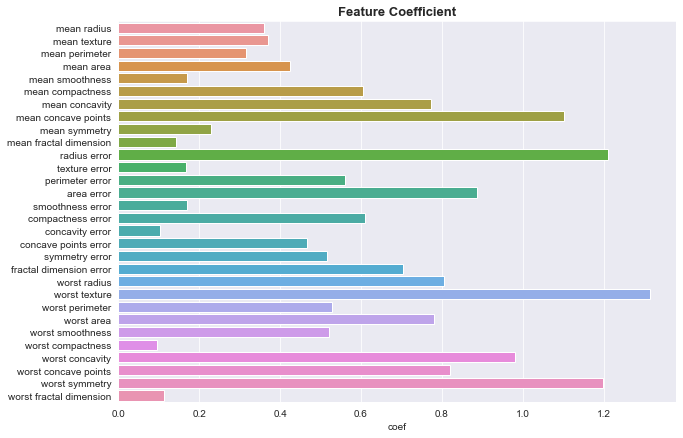

In [73]:
plt.figure(figsize=(10,7))
plt.title('Feature Coefficient', size=13, fontweight='bold')
sns.barplot(y=feature_importance.index, x=feature_importance['coef'])
plt.show()

# SMOTE & PCA

## SMOTE Oversampling

In [74]:
smote = SMOTE() #random_state=42, sampling_strategy=1.0, k_neighbors=5

In [75]:
Xsmot_train, ysmot_train = smote.fit_sample(X_train, y_train)

In [76]:
ysmot_train.value_counts()

1    249
0    249
Name: target, dtype: int64

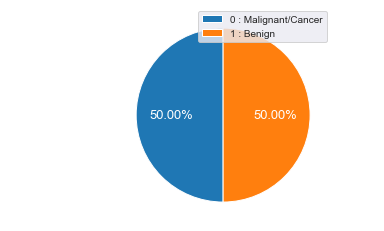

In [77]:
size = len(ysmot_train[ysmot_train==0]), len(ysmot_train[ysmot_train==1])
labels = ['0 : Malignant/Cancer', '1 : Benign']

plt.pie(size, labels=labels, autopct='%.2f%%', startangle=90, textprops={'size':13, 'color':'white'})
plt.legend()
plt.show()

In [78]:
logreg_smot = LogisticRegression()

In [79]:
logreg_smot.fit(Xsmot_train, ysmot_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [80]:
pred_logreg_smot = logreg_smot.predict(X_test)
proba_logreg_smot = logreg_smot.predict_proba(X_test)

In [81]:
print(confusion_matrix(y_test, pred_logreg_smot))

[[ 62   1]
 [  2 106]]


In [82]:
print(classification_report(y_test, pred_logreg_smot))

              precision    recall  f1-score   support

           0       0.97      0.98      0.98        63
           1       0.99      0.98      0.99       108

    accuracy                           0.98       171
   macro avg       0.98      0.98      0.98       171
weighted avg       0.98      0.98      0.98       171



In [83]:
cr_logreg_smot = classification_report(y_test,pred_logreg_smot,output_dict=True)
cr_logreg_smot = pd.DataFrame(cr_logreg_smot).T
cr_logreg_smot

,precision,recall,f1-score,support
0,0.968750,0.984127,0.976378,63.000000
1,0.990654,0.981481,0.986047,108.000000
accuracy,0.982456,0.982456,0.982456,0.982456
macro avg,0.979702,0.982804,0.981212,171.000000
weighted avg,0.982584,0.982456,0.982484,171.000000


In [84]:
cv_score_logreg_smot = round(cross_val_score(logreg_smot, X_test, y_test, cv = 10, scoring='precision').mean()*100,2)
cv_score_logreg_smot

97.63

### ROC AUC SMOTE

In [85]:
#Logistic Regression SMOTE
prob_logreg_smot = proba_logreg_smot[:,1]
fpr_logreg_smot, tpr_logreg_smot, threshold_logreg_smot = roc_curve(y_test, prob_logreg_smot)
roc_auc_logreg_smot = auc(fpr_logreg_smot, tpr_logreg_smot)

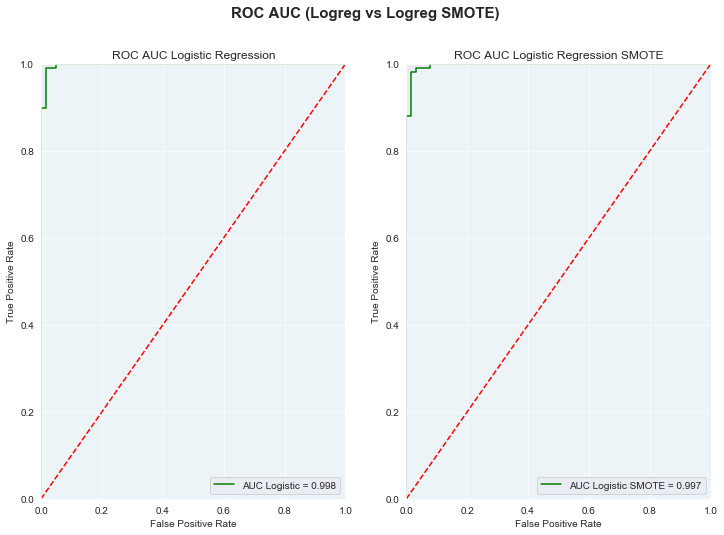

In [86]:
plt.figure(figsize=(12,8))
plt.suptitle('ROC AUC (Logreg vs Logreg SMOTE)', fontsize=15, fontweight='bold')

plt.subplot(121)
plt.title('ROC AUC Logistic Regression')
plt.plot(fpr_logreg, tpr_logreg, 'green', label='AUC Logistic = {}'.format(round(roc_auc_logreg,3)))
plt.plot([0,1],[0,1], 'r--')
plt.xlim([0,1])
plt.ylim([0,1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.fill_between(fpr_logreg,tpr_logreg, 0, facecolor='azure', alpha=0.5)
plt.legend(loc = 'lower right')

plt.subplot(122)
plt.title('ROC AUC Logistic Regression SMOTE')
plt.plot(fpr_logreg_smot, tpr_logreg_smot, 'green', label='AUC Logistic SMOTE = {}'.format(round(roc_auc_logreg_smot,3)))
plt.plot([0,1],[0,1], 'r--')
plt.xlim([0,1])
plt.ylim([0,1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.fill_between(fpr_logreg_smot,tpr_logreg_smot, 0, facecolor='azure', alpha=0.5)
plt.legend(loc = 'lower right')

plt.show()

### Evaluation Metric (Logreg vs Logreg SMOTE)

In [87]:
# Logistic Regression 
prec_logreg = round(cr_logreg.iloc[1,0]*100,2)
rec_logreg = round(cr_logreg.iloc[0,1]*100,2)
acc_logerg = round(cr_logreg.iloc[2,0]*100,2)
auc_logreg = round(auc(fpr_logreg, tpr_logreg)*100,3)

# Logistic Regression SMOTE
prec_logreg_smot = round(cr_logreg_smot.iloc[1,0]*100,2)
rec_logreg_smot = round(cr_logreg_smot.iloc[0,1]*100,2)
acc_logerg_smot = round(cr_logreg_smot.iloc[2,0]*100,2)
auc_logreg_smot = round(auc(fpr_logreg_smot, tpr_logreg_smot)*100,3)

In [88]:
all_prec2 = [prec_logreg, prec_logreg_smot]
all_rec2 = [rec_logreg, rec_logreg_smot]
all_acc2 = [acc_logerg, acc_logerg_smot]
all_auc2 = [auc_logreg, auc_logreg_smot]

all_cv_score2 = [cv_score_logreg, cv_score_logreg_smot]

In [89]:
df_mtrc_smot = pd.DataFrame([all_prec2, all_rec2, all_acc2, all_auc2, all_cv_score2], 
                       columns=['logreg', 'logreg_smote'],
                       index=['precision(+)', 'recall(-)', 'accuracy', 'auc', 'cv_score'])
df_mtrc_smot = df_mtrc_smot.T
df_mtrc_smot

,precision(+),recall(-),accuracy,auc,cv_score
logreg,99.07,98.41,98.25,99.809,97.63
logreg_smote,99.07,98.41,98.25,99.735,97.63


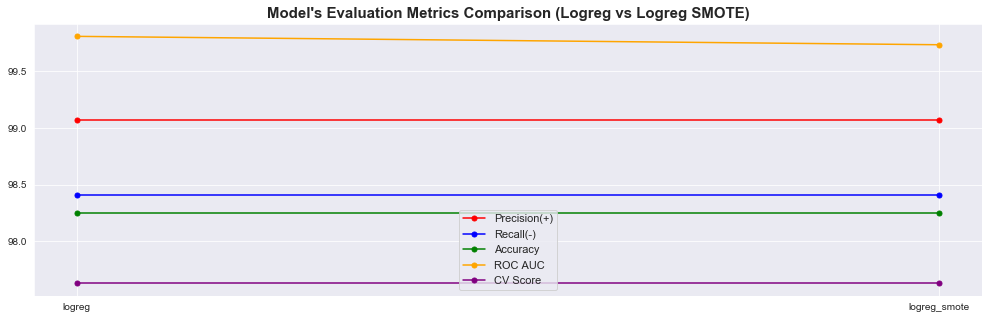

In [90]:
plt.figure(figsize=(17,5))
plt.title("Model's Evaluation Metrics Comparison (Logreg vs Logreg SMOTE)", size=15, fontweight='bold')

plt.plot(df_mtrc_smot.index, df_mtrc_smot['precision(+)'], label = 'Precision(+)', color='red', marker='o', markersize=5)
plt.plot(df_mtrc_smot.index, df_mtrc_smot['recall(-)'], label = 'Recall(-)', color='blue', marker='o', markersize=5)
plt.plot(df_mtrc_smot.index, df_mtrc_smot['accuracy'], label = 'Accuracy', color='green', marker='o', markersize=5)
plt.plot(df_mtrc_smot.index, df_mtrc_smot['auc'], label = 'ROC AUC', color='orange', marker='o', markersize=5)
plt.plot(df_mtrc_smot.index, df_mtrc_smot['cv_score'], label = 'CV Score', color='purple', marker='o', markersize=5)
plt.legend(loc='lower center', prop={'size': 11})
plt.show()

## Principal Component Analyasis (PCA)

In [91]:
pca = PCA(n_components = 4)

In [92]:
feature_pca = scaled_data.drop('target',axis=1)
feature_pca

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,1.097064,-2.073335,1.269934,0.984375,1.568466,3.283515,2.652874,2.532475,2.217515,2.255747,...,1.886690,-1.359293,2.303601,2.001237,1.307686,2.616665,2.109526,2.296076,2.750622,1.937015
1,1.829821,-0.353632,1.685955,1.908708,-0.826962,-0.487072,-0.023846,0.548144,0.001392,-0.868652,...,1.805927,-0.369203,1.535126,1.890489,-0.375612,-0.430444,-0.146749,1.087084,-0.243890,0.281190
2,1.579888,0.456187,1.566503,1.558884,0.942210,1.052926,1.363478,2.037231,0.939685,-0.398008,...,1.511870,-0.023974,1.347475,1.456285,0.527407,1.082932,0.854974,1.955000,1.152255,0.201391
3,-0.768909,0.253732,-0.592687,-0.764464,3.283553,3.402909,1.915897,1.451707,2.867383,4.910919,...,-0.281464,0.133984,-0.249939,-0.550021,3.394275,3.893397,1.989588,2.175786,6.046041,4.935010
4,1.750297,-1.151816,1.776573,1.826229,0.280372,0.539340,1.371011,1.428493,-0.009560,-0.562450,...,1.298575,-1.466770,1.338539,1.220724,0.220556,-0.313395,0.613179,0.729259,-0.868353,-0.397100
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,2.110995,0.721473,2.060786,2.343856,1.041842,0.219060,1.947285,2.320965,-0.312589,-0.931027,...,1.901185,0.117700,1.752563,2.015301,0.378365,-0.273318,0.664512,1.629151,-1.360158,-0.709091
565,1.704854,2.085134,1.615931,1.723842,0.102458,-0.017833,0.693043,1.263669,-0.217664,-1.058611,...,1.536720,2.047399,1.421940,1.494959,-0.691230,-0.394820,0.236573,0.733827,-0.531855,-0.973978
566,0.702284,2.045574,0.672676,0.577953,-0.840484,-0.038680,0.046588,0.105777,-0.809117,-0.895587,...,0.561361,1.374854,0.579001,0.427906,-0.809587,0.350735,0.326767,0.414069,-1.104549,-0.318409
567,1.838341,2.336457,1.982524,1.735218,1.525767,3.272144,3.296944,2.658866,2.137194,1.043695,...,1.961239,2.237926,2.303601,1.653171,1.430427,3.904848,3.197605,2.289985,1.919083,2.219635


In [93]:
x_pca = pca.fit_transform(feature_pca)
x_pca

array([[ 9.19283683,  1.94858315, -1.12316539,  3.63372992],
       [ 2.38780179, -3.76817169, -0.52929222,  1.11826508],
       [ 5.73389628, -1.07517392, -0.55174878,  0.91208193],
       ...,
       [ 1.25617928, -1.90229672,  0.56273049, -2.08922667],
       [10.37479406,  1.67201006, -1.87702979, -2.35603142],
       [-5.4752433 , -0.67063688,  1.49044224, -2.29915895]])

In [94]:
len(x_pca)

569

In [95]:
df_pca = pd.DataFrame(x_pca)
df_pca['target'] = scaled_data['target']
df_pca

,0,1,2,3,target
0,9.192837,1.948583,-1.123165,3.633730,0
1,2.387802,-3.768172,-0.529292,1.118265,0
2,5.733896,-1.075174,-0.551749,0.912082,0
3,7.122953,10.275589,-3.232789,0.152547,0
4,3.935302,-1.948072,1.389766,2.940639,0
...,...,...,...,...,...
564,6.439315,-3.576818,2.459485,1.177313,0
565,3.793382,-3.584048,2.088476,-2.506027,0
566,1.256179,-1.902297,0.562730,-2.089227,0
567,10.374794,1.672010,-1.877030,-2.356031,0


In [96]:
for i in df_pca.columns[:4]:
    df_pca.rename({int(i): f'PC{int(i)+1}'}, axis=1, inplace=True)

In [97]:
df_pca

,PC1,PC2,PC3,PC4,target
0,9.192837,1.948583,-1.123165,3.633730,0
1,2.387802,-3.768172,-0.529292,1.118265,0
2,5.733896,-1.075174,-0.551749,0.912082,0
3,7.122953,10.275589,-3.232789,0.152547,0
4,3.935302,-1.948072,1.389766,2.940639,0
...,...,...,...,...,...
564,6.439315,-3.576818,2.459485,1.177313,0
565,3.793382,-3.584048,2.088476,-2.506027,0
566,1.256179,-1.902297,0.562730,-2.089227,0
567,10.374794,1.672010,-1.877030,-2.356031,0


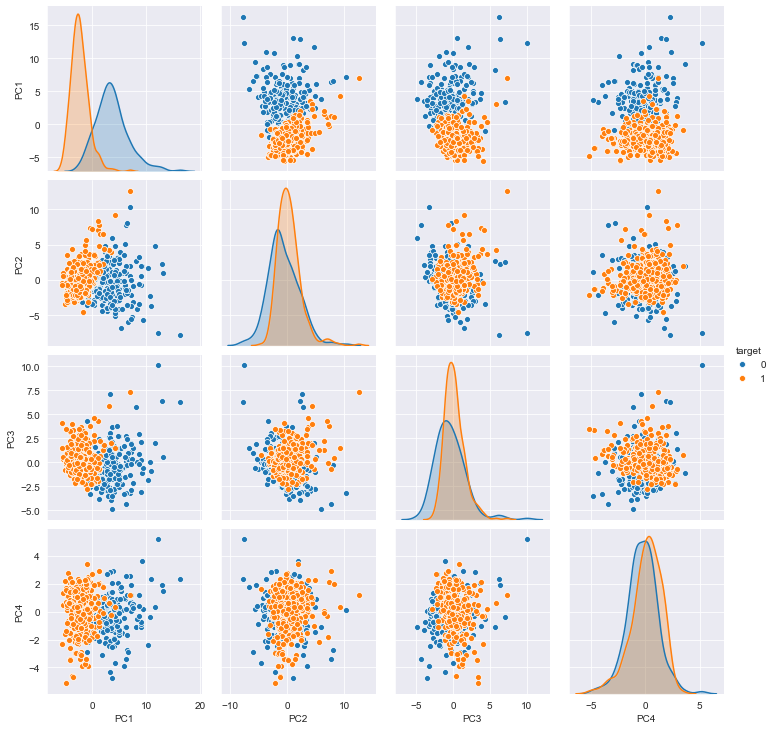

In [98]:
sns.pairplot(df_pca, hue='target')

PC1 & PC2 work well to separating `target`

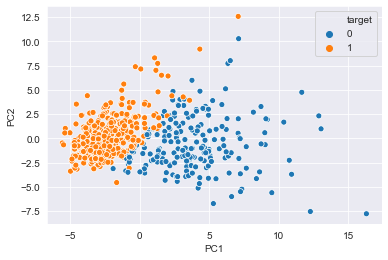

In [99]:
sns.scatterplot('PC1', 'PC2', hue='target', data=df_pca)
plt.show()

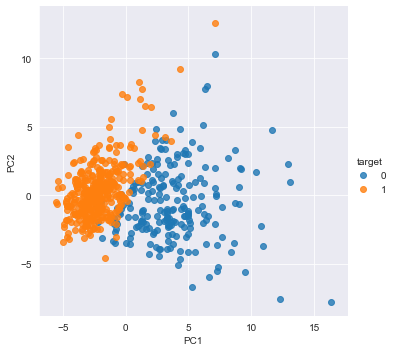

In [100]:
sns.lmplot(x='PC1', y='PC2', hue='target', data=df_pca, fit_reg=False)
plt.show()

### Train Test Split  4 PCA

In [101]:
#Use all PC
X4pca = df_pca.drop('target',axis=1)
y4pca = df_pca['target']

In [102]:
X4pca_train, X4pca_test, y4pca_train, y4pca_test = train_test_split(X4pca, y4pca, test_size=.2, random_state=42)

In [103]:
# Use only PC1 & PC2
X2pca = df_pca.drop(['target', 'PC3', 'PC4'],axis=1)
y2pca = df_pca['target']

In [104]:
X2pca_train, X2pca_test, y2pca_train, y2pca_test = train_test_split(X2pca, y2pca, test_size=.2, random_state=42)

### Modelling PCA

$4PCA$

In [105]:
logreg_4pca = LogisticRegression()

In [106]:
logreg_4pca.fit(X4pca_train, y4pca_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [107]:
pred_logreg_4pca = logreg_4pca.predict(X4pca_test)
proba_logreg_4pca = logreg_4pca.predict_proba(X4pca_test)

In [108]:
print(confusion_matrix(y4pca_test, pred_logreg_4pca))

[[41  2]
 [ 1 70]]


In [109]:
print(classification_report(y4pca_test, pred_logreg_4pca))

              precision    recall  f1-score   support

           0       0.98      0.95      0.96        43
           1       0.97      0.99      0.98        71

    accuracy                           0.97       114
   macro avg       0.97      0.97      0.97       114
weighted avg       0.97      0.97      0.97       114



In [110]:
cr_logreg_4pca = classification_report(y4pca_test,pred_logreg_4pca,output_dict=True)
cr_logreg_4pca = pd.DataFrame(cr_logreg_4pca).T
cr_logreg_4pca

,precision,recall,f1-score,support
0,0.976190,0.953488,0.964706,43.000000
1,0.972222,0.985915,0.979021,71.000000
accuracy,0.973684,0.973684,0.973684,0.973684
macro avg,0.974206,0.969702,0.971863,114.000000
weighted avg,0.973719,0.973684,0.973621,114.000000


In [111]:
cv_score_logreg_4pca = round(cross_val_score(logreg_4pca, X4pca_test, y4pca_test, cv = 10, scoring='precision').mean()*100,2)
cv_score_logreg_4pca

96.53

$2PCA$

In [112]:
logreg_2pca = LogisticRegression()
logreg_2pca.fit(X2pca_train, y2pca_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [113]:
pred_logreg_2pca = logreg_2pca.predict(X2pca_test)
proba_logreg_2pca = logreg_2pca.predict_proba(X2pca_test)

In [114]:
print(confusion_matrix(y2pca_test, pred_logreg_2pca))

[[42  1]
 [ 0 71]]


In [115]:
print(classification_report(y2pca_test, pred_logreg_2pca))

              precision    recall  f1-score   support

           0       1.00      0.98      0.99        43
           1       0.99      1.00      0.99        71

    accuracy                           0.99       114
   macro avg       0.99      0.99      0.99       114
weighted avg       0.99      0.99      0.99       114



In [116]:
cr_logreg_2pca = classification_report(y2pca_test,pred_logreg_2pca,output_dict=True)
cr_logreg_2pca = pd.DataFrame(cr_logreg_2pca).T
cr_logreg_2pca

,precision,recall,f1-score,support
0,1.000000,0.976744,0.988235,43.000000
1,0.986111,1.000000,0.993007,71.000000
accuracy,0.991228,0.991228,0.991228,0.991228
macro avg,0.993056,0.988372,0.990621,114.000000
weighted avg,0.991350,0.991228,0.991207,114.000000


In [117]:
cv_score_logreg_2pca = round(cross_val_score(logreg_2pca, X2pca_test, y4pca_test, cv = 10, scoring='precision').mean()*100,2)
cv_score_logreg_2pca

97.78

### ROC AUC PCA

In [118]:
#Logistic Regression 4PCA
prob_logreg_4pca = proba_logreg_4pca[:,1]
fpr_logreg_4pca, tpr_logreg_4pca, threshold_logreg_4pca = roc_curve(y4pca_test, prob_logreg_4pca)
roc_auc_logreg_4pca = auc(fpr_logreg_4pca, tpr_logreg_4pca)

#Logistic Regression 2PCA
prob_logreg_2pca = proba_logreg_2pca[:,1]
fpr_logreg_2pca, tpr_logreg_2pca, threshold_logreg_2pca = roc_curve(y2pca_test, prob_logreg_2pca)
roc_auc_logreg_2pca = auc(fpr_logreg_2pca, tpr_logreg_2pca)

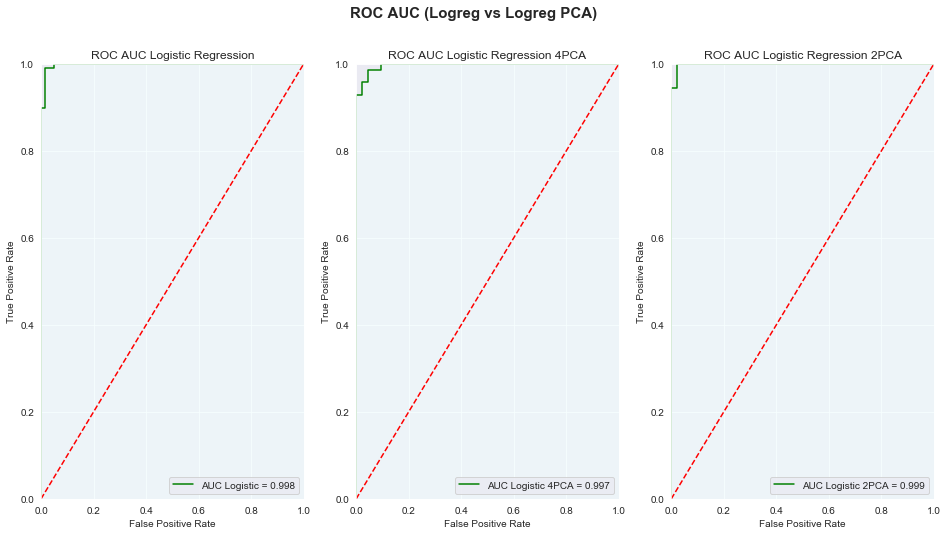

In [119]:
plt.figure(figsize=(16,8))
plt.suptitle('ROC AUC (Logreg vs Logreg PCA)', fontsize=15, fontweight='bold')

plt.subplot(131)
plt.title('ROC AUC Logistic Regression')
plt.plot(fpr_logreg, tpr_logreg, 'green', label='AUC Logistic = {}'.format(round(roc_auc_logreg,3)))
plt.plot([0,1],[0,1], 'r--')
plt.xlim([0,1])
plt.ylim([0,1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.fill_between(fpr_logreg,tpr_logreg, 0, facecolor='azure', alpha=0.5)
plt.legend(loc = 'lower right')

plt.subplot(132)
plt.title('ROC AUC Logistic Regression 4PCA')
plt.plot(fpr_logreg_4pca, tpr_logreg_4pca, 'green', label='AUC Logistic 4PCA = {}'.format(round(roc_auc_logreg_4pca,3)))
plt.plot([0,1],[0,1], 'r--')
plt.xlim([0,1])
plt.ylim([0,1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.fill_between(fpr_logreg_4pca,tpr_logreg_4pca, 0, facecolor='azure', alpha=0.5)
plt.legend(loc = 'lower right')

plt.subplot(133)
plt.title('ROC AUC Logistic Regression 2PCA')
plt.plot(fpr_logreg_2pca, tpr_logreg_2pca, 'green', label='AUC Logistic 2PCA = {}'.format(round(roc_auc_logreg_2pca,3)))
plt.plot([0,1],[0,1], 'r--')
plt.xlim([0,1])
plt.ylim([0,1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.fill_between(fpr_logreg_2pca,tpr_logreg_2pca, 0, facecolor='azure', alpha=0.5)
plt.legend(loc = 'lower right')

plt.show()

### Evaluation Metric PCA

In [120]:
# Logistic Regression 
prec_logreg = round(cr_logreg.iloc[1,0]*100,2)
rec_logreg = round(cr_logreg.iloc[0,1]*100,2)
acc_logerg = round(cr_logreg.iloc[2,0]*100,2)
auc_logreg = round(auc(fpr_logreg, tpr_logreg)*100,3)

# Logistic Regression 4pca
prec_logreg_4pca = round(cr_logreg_4pca.iloc[1,0]*100,2)
rec_logreg_4pca = round(cr_logreg_4pca.iloc[0,1]*100,2)
acc_logerg_4pca = round(cr_logreg_4pca.iloc[2,0]*100,2)
auc_logreg_4pca = round(auc(fpr_logreg_4pca, tpr_logreg_4pca)*100,3)

# Logistic Regression 2pca
prec_logreg_2pca = round(cr_logreg_2pca.iloc[1,0]*100,2)
rec_logreg_2pca = round(cr_logreg_2pca.iloc[0,1]*100,2)
acc_logerg_2pca = round(cr_logreg_2pca.iloc[2,0]*100,2)
auc_logreg_2pca = round(auc(fpr_logreg_2pca, tpr_logreg_2pca)*100,3)

In [121]:
all_prec3 = [prec_logreg, prec_logreg_4pca, prec_logreg_2pca]
all_rec3 = [rec_logreg, rec_logreg_4pca, rec_logreg_2pca]
all_acc3 = [acc_logerg, acc_logerg_4pca, acc_logerg_2pca]
all_auc3 = [auc_logreg, auc_logreg_4pca, auc_logreg_2pca]

all_cv_score3 = [cv_score_logreg, cv_score_logreg_4pca, cv_score_logreg_2pca]

In [122]:
df_mtrc_pca = pd.DataFrame([all_prec3, all_rec3, all_acc3, all_auc3, all_cv_score3], 
                       columns=['logreg', 'logreg_4pca', 'logreg_2pca'],
                       index=['precision(+)', 'recall(-)', 'accuracy', 'auc', 'cv_score'])
df_mtrc_pca = df_mtrc_pca.T
df_mtrc_pca

,precision(+),recall(-),accuracy,auc,cv_score
logreg,99.07,98.41,98.25,99.809,97.63
logreg_4pca,97.22,95.35,97.37,99.672,96.53
logreg_2pca,98.61,97.67,99.12,99.869,97.78


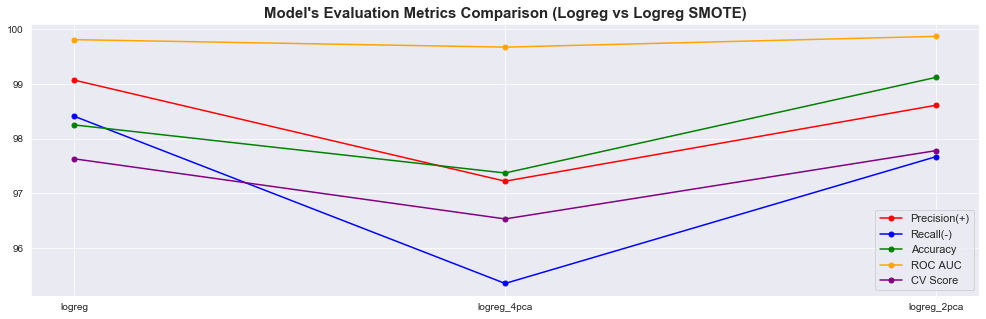

In [123]:
plt.figure(figsize=(17,5))
plt.title("Model's Evaluation Metrics Comparison (Logreg vs Logreg SMOTE)", size=15, fontweight='bold')

plt.plot(df_mtrc_pca.index, df_mtrc_pca['precision(+)'], label = 'Precision(+)', color='red', marker='o', markersize=5)
plt.plot(df_mtrc_pca.index, df_mtrc_pca['recall(-)'], label = 'Recall(-)', color='blue', marker='o', markersize=5)
plt.plot(df_mtrc_pca.index, df_mtrc_pca['accuracy'], label = 'Accuracy', color='green', marker='o', markersize=5)
plt.plot(df_mtrc_pca.index, df_mtrc_pca['auc'], label = 'ROC AUC', color='orange', marker='o', markersize=5)
plt.plot(df_mtrc_pca.index, df_mtrc_pca['cv_score'], label = 'CV Score', color='purple', marker='o', markersize=5)
plt.legend(loc='lower right', prop={'size': 11})
plt.show()